# MultiLanguage OCR Detection and Extraction:
We are going to use [`EasyOCR`](https://github.com/JaidedAI/EasyOCR) Library for Multilanguage Detection,

They are currently supporting the following 54 languages:

Afrikaans (af), Azerbaijani (az), Belarusian (be), Bulgarian (bg), Bosnian (bs), Simplified Chinese (ch_sim), Traditional Chinese (ch_tra), Czech (cs), Welsh (cy), Danish (da), German (de), English (en), Spanish (es), Estonian (et), French (fr), Irish (ga), Hindi(hi), Croatian (hr), Hungarian (hu), Indonesian (id), Icelandic (is), Italian (it), Japanese (ja), Korean (ko), Kurdish (ku), Latin (la), Lithuanian (lt), Latvian (lv), Maori (mi), Mongolian (mn), Marathi (mr), Malay (ms), Maltese (mt), Nepali (ne), Dutch (nl), Norwegian (no), Occitan (oc), Polish (pl), Portuguese (pt), Romanian (ro), Russian (ru), Serbian (cyrillic)(rs_cyrillic), Serbian (latin)(rs_latin), Slovak (sk) (need revisit), Slovenian (sl), Albanian (sq), Swedish (sv), Swahili (sw), Thai (th), Tagalog (tl), Turkish (tr), Ukranian(uk), Uzbek (uz), Vietnamese (vi)

## Installation


In [ ]:
!pip install easyocr opencv-python-headless matplotlib aiofiles


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 32.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 307.2/307.2 kB 19.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 908.3/908.3 kB 37.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 281.3/281.3 kB 19.5 MB/s eta 0:00:00


In [ ]:
# Create a reader to do OCR.
# If you change to GPU instance, it will be faster. But CPU is enough.
# (by MENU > Runtime > Change runtime type > GPU, then redo from beginning )
from PIL import Image, ImageDraw
import cv2
import numpy as np
import time
import easyocr
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import aiofiles
from concurrent.futures import ThreadPoolExecutor

### Text Extraction on High Quality Image

Detected Text: TathuoN (Confidence: 0.21120739843943884)
Detected Text: Ilu W (Confidence: 0.1642596128440442)
Detected Text: PRESS (Confidence: 0.7763463041891489)
Detected Text: MaRNIILCT (Confidence: 0.055707521462505044)Detected Text: TaHION (Confidence: 0.028138782007099336)

Detected Text: [?bikec8 (Confidence: 0.29138846439726707)
Detected Text: 703 (Confidence: 0.5455524656662001)
Detected Text: ME (Confidence: 0.10569251577045843)
Detected Text: 68 (Confidence: 0.3709654178870348)
Detected Text: 904 (Confidence: 0.9999790082473178)
Detected Text: TaHION (Confidence: 0.0285501433734253)
Detected Text: Nam (Confidence: 0.18480088248519863)
Detected Text: 7E8k86 (Confidence: 0.008941369970900857)
Detected Text: J (Confidence: 0.058024192640809824)
Detected Text: Vitul (Confidence: 0.009305950195320165)
Detected Text: TathuoN (Confidence: 0.2221038137498621)
Detected Text: PINARELLs (Confidence: 0.5296355065918984)
Detected Text: 2 (Confidence: 0.26199688978528)
Detected Text: Ano

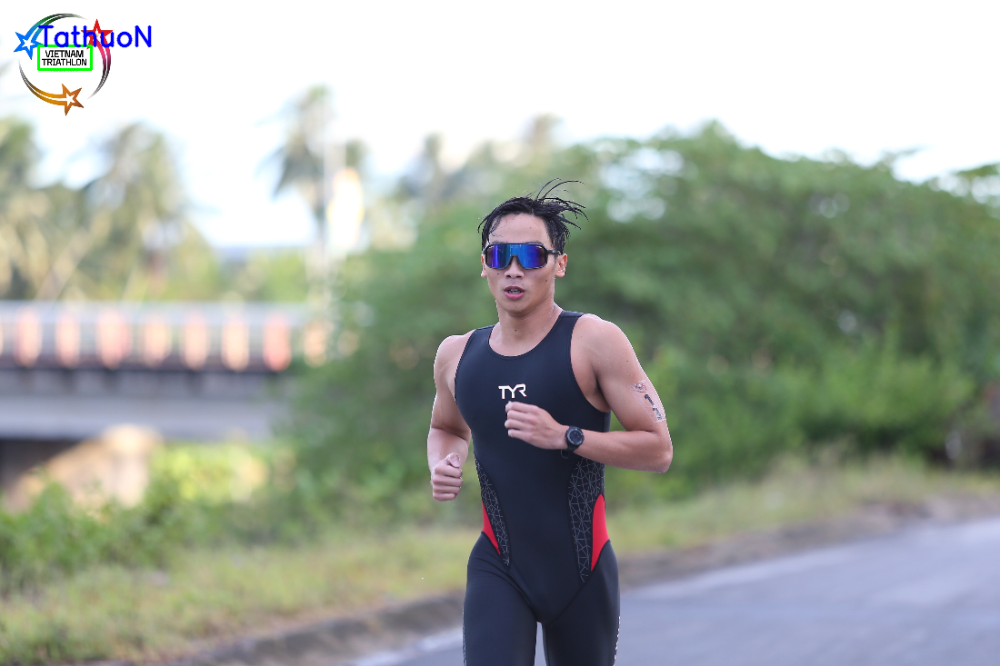

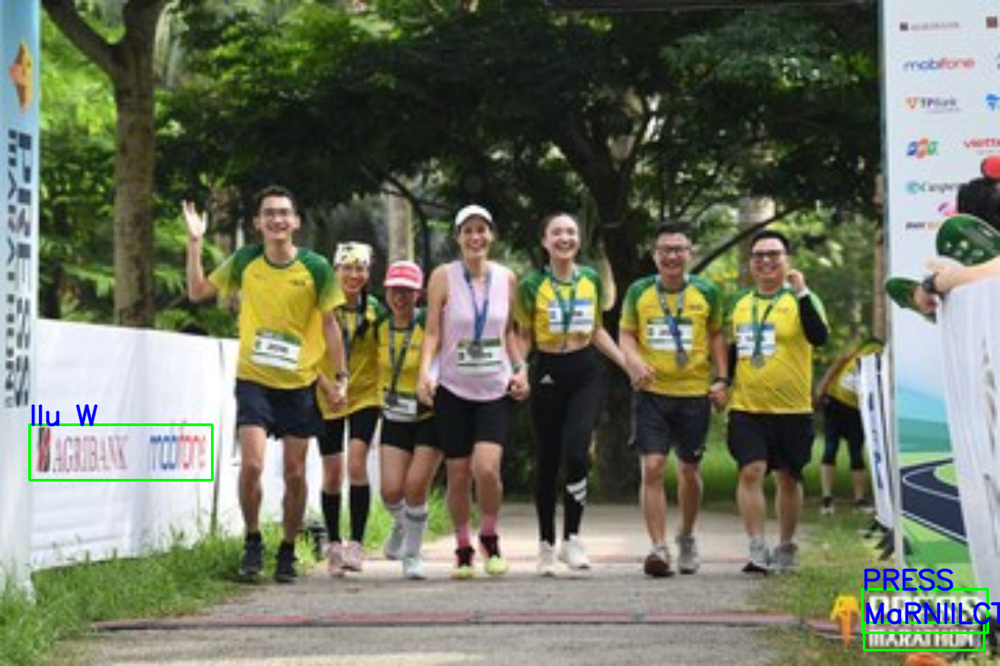

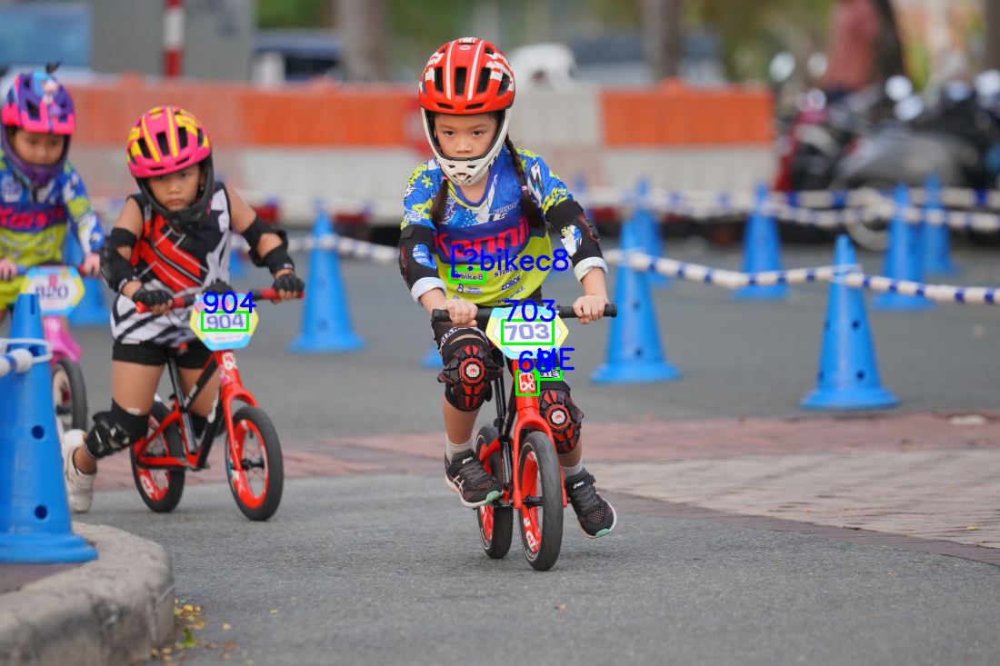

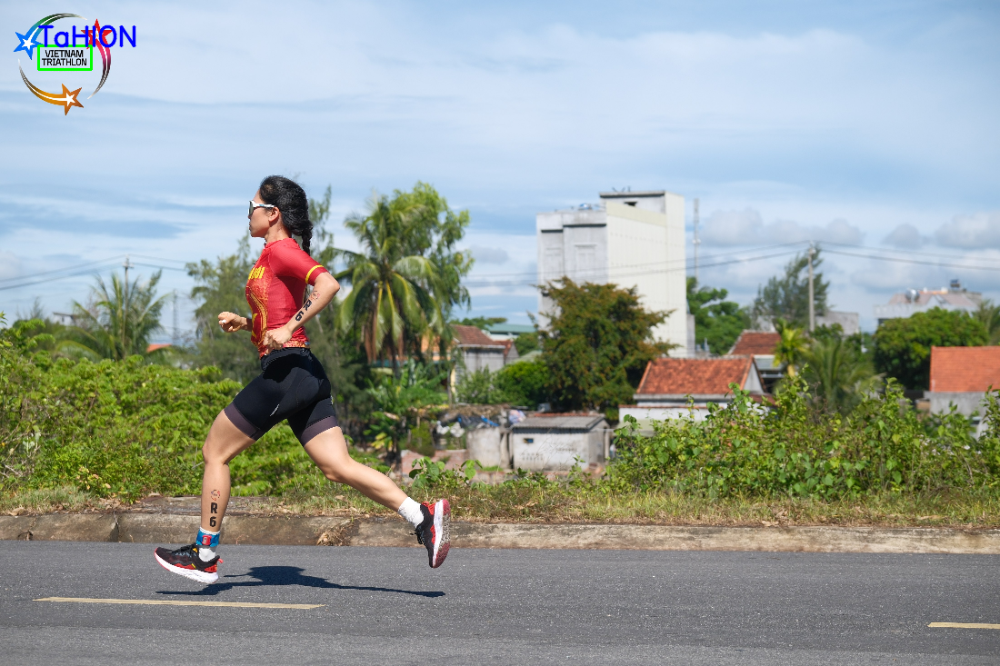

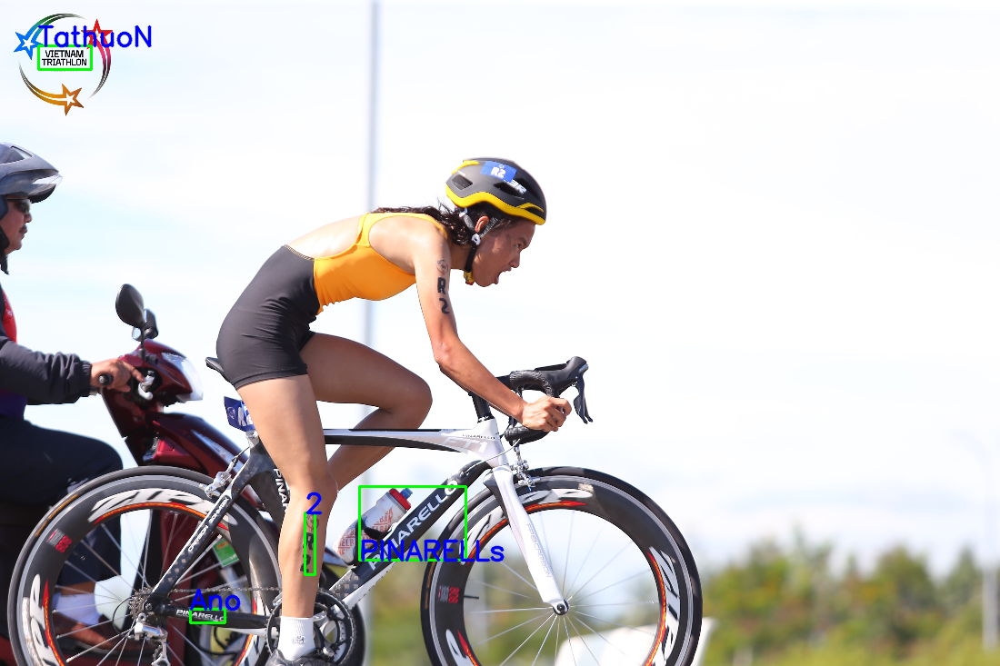

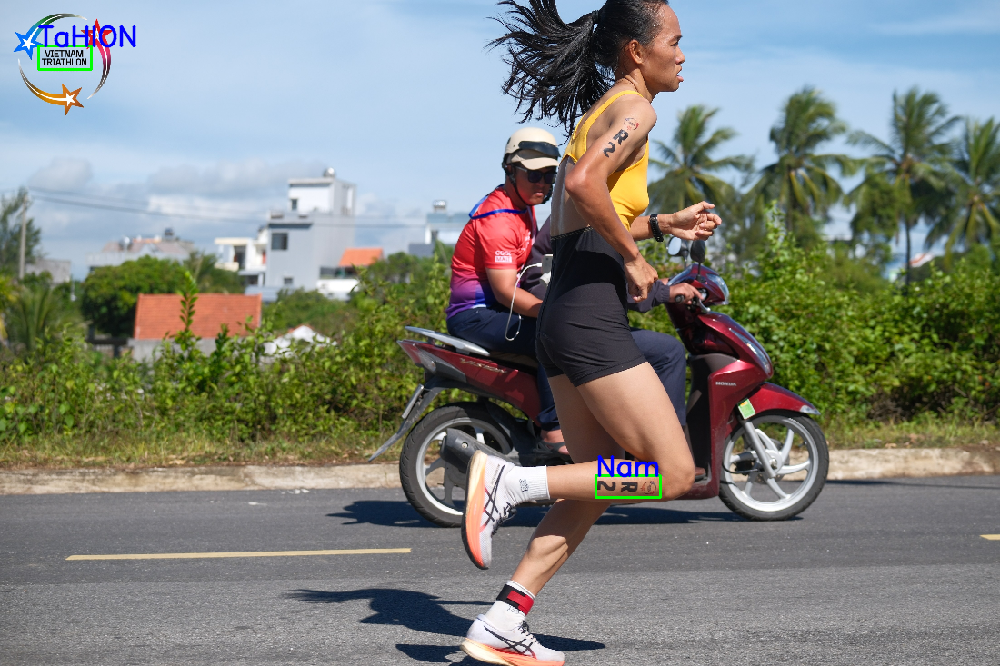

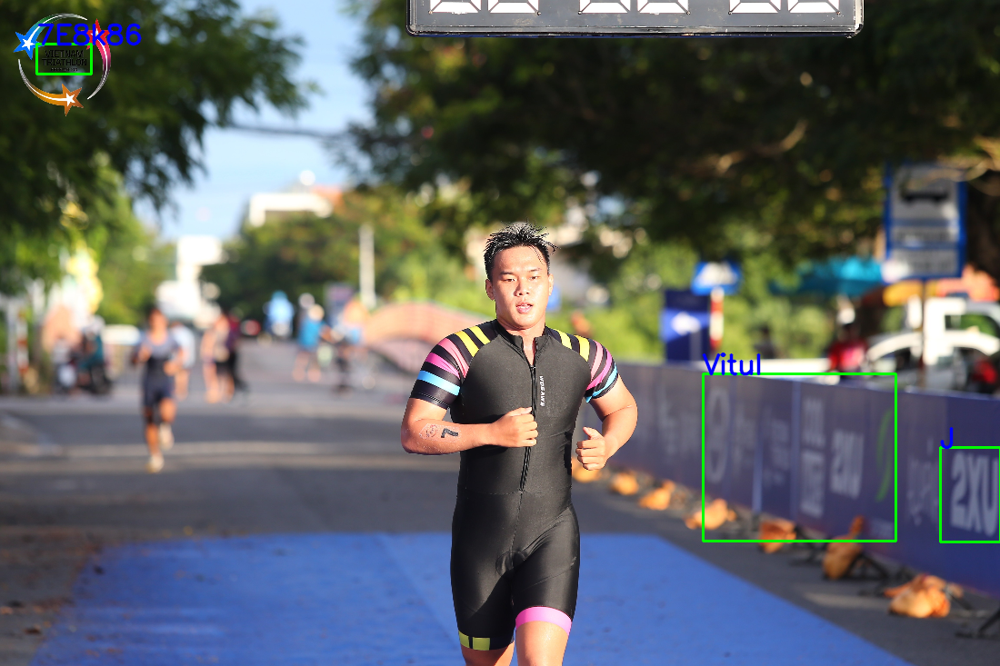

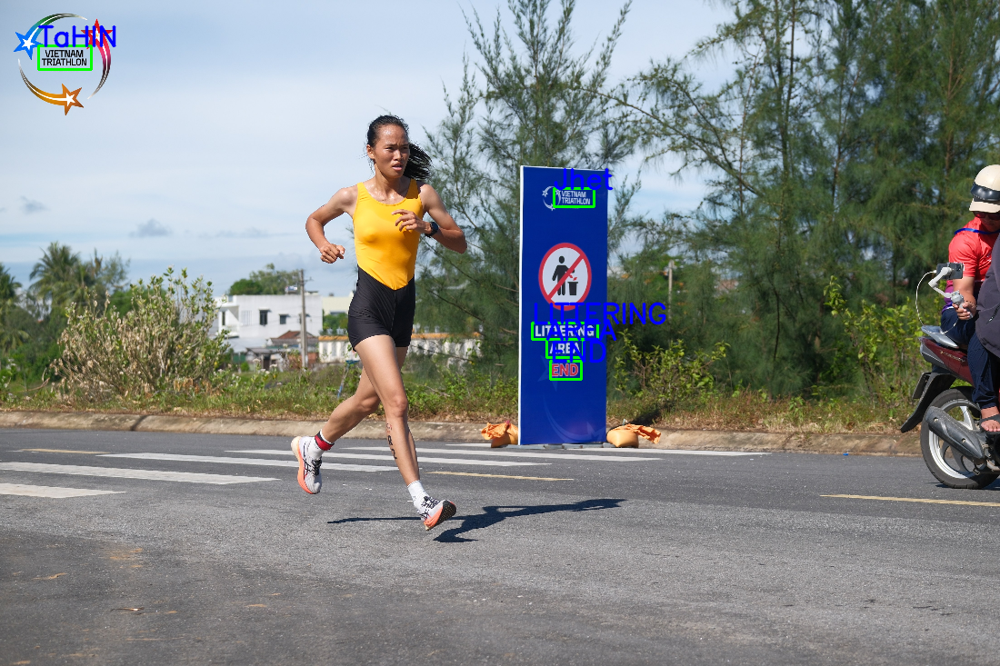

Detected Text: TaHION (Confidence: 0.026474245933844318)
Detected Text: Nering (Confidence: 0.24479326661368903)
Detected Text: Area (Confidence: 0.5878082513809204)
Detected Text: END (Confidence: 0.4725201706877705)
Detected Text: 8 (Confidence: 0.4519193047111827)
Detected Text: Del (Confidence: 0.0030169278244772)
Detected Text: MARATHON Buu (Confidence: 0.7265675541546274)
Detected Text: 2074 (Confidence: 0.14972718358564865)
Detected Text: RUN (Confidence: 0.429329599137088)
Detected Text: RUM (Confidence: 0.2257382776304611)
Detected Text: 355 (Confidence: 0.1526545420326471)
Detected Text: StQraraTn (Confidence: 0.11945376105248867)
Detected Text: 20712 (Confidence: 0.9985823681785088)
Detected Text: ADRUN (Confidence: 0.2777444778649617)
Detected Text: STOP (Confidence: 0.9748075008392334)
Detected Text: Irathon (Confidence: 0.014092392869699577)
Detected Text: MARATHON Bul (Confidence: 0.7081951619782962)
Detected Text: 7024 (Confidence: 0.15165694057941437)
Detected Text: Li

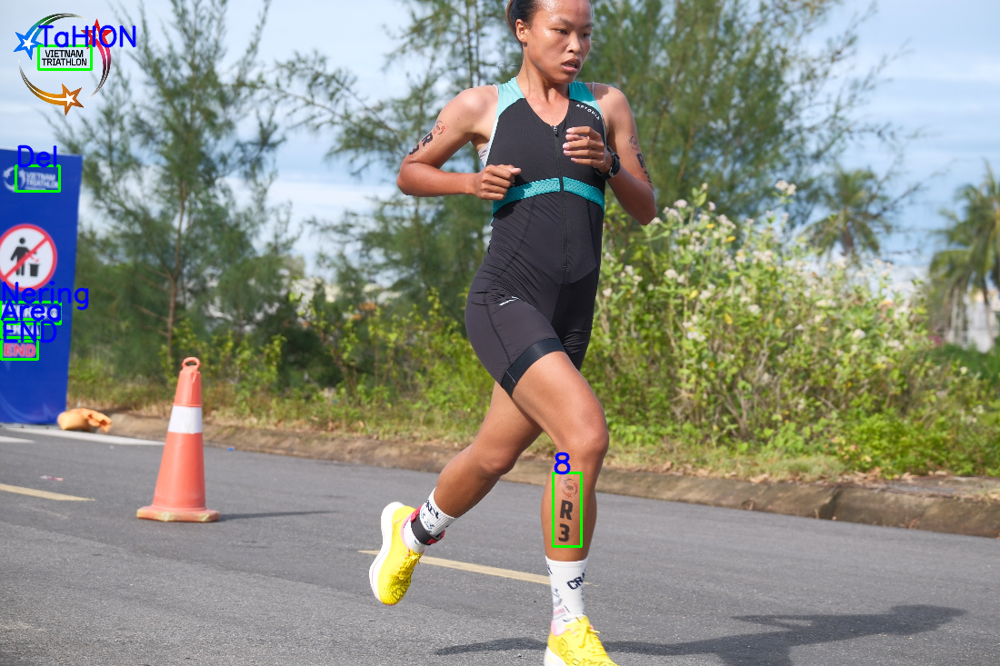

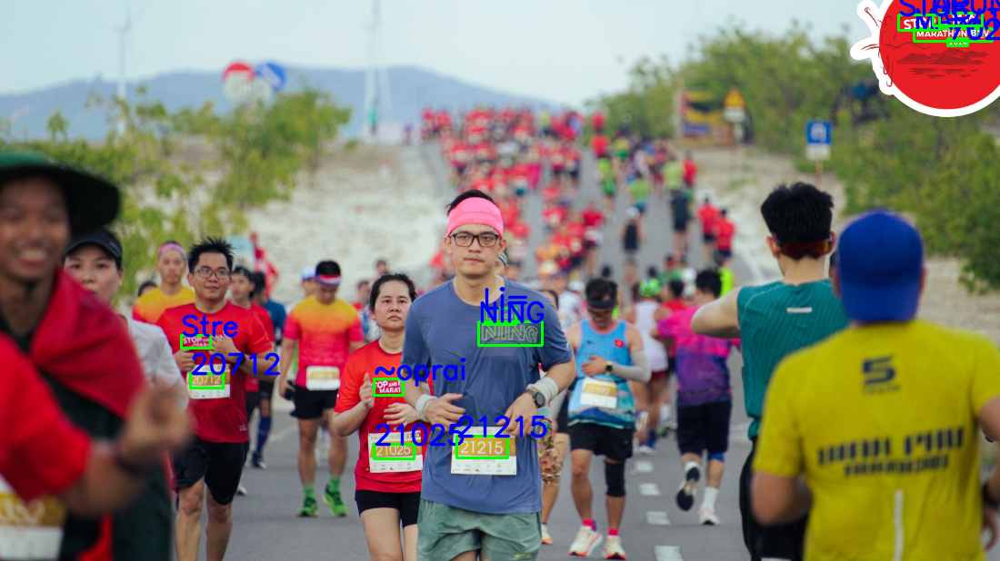

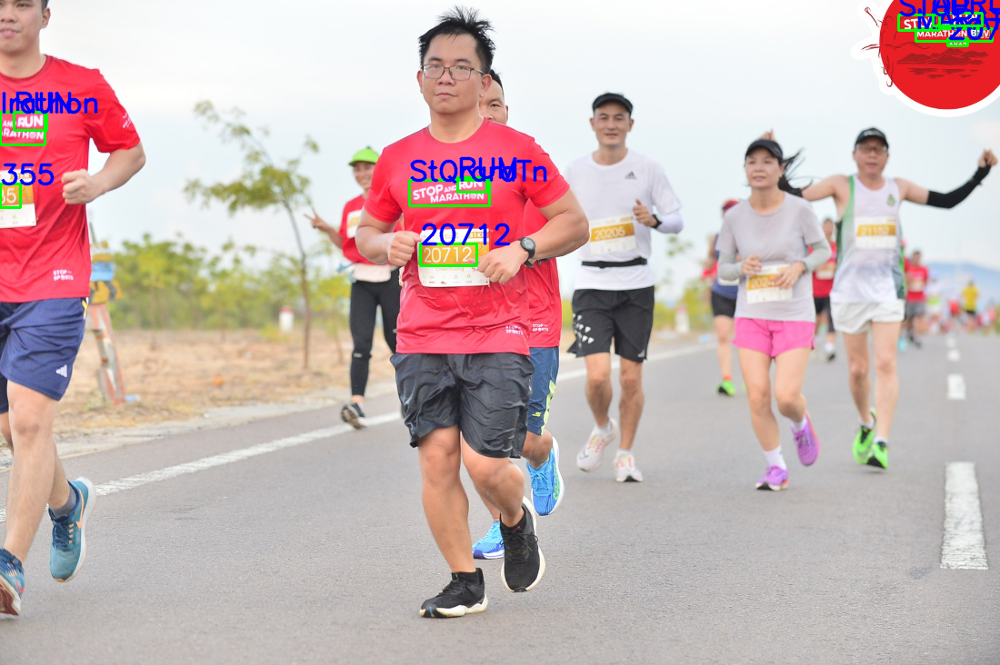

Time taken to extract text: 4.29 seconds


In [ ]:
from threading import Thread
from concurrent.futures import ThreadPoolExecutor

datas = []
for x in range(11):
    datas.append(f'/content/test{x + 1}.jpg')

def detect_image(image_path , reader):
    #Read and resize the image for faster processing (optional)
    image = cv2.imread(image_path)
    height, width = image.shape[:2]
    new_width = 1100  # Adjust based on your need
    new_height = int((new_width / width) * height)
    image = cv2.resize(image, (new_width, new_height))

    image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)


    # Detect text in the image
    results = reader.readtext(image, detail=1)

    # Display detected text
    for (bbox, text, prob) in results:
      print(f"Detected Text: {text} (Confidence: {prob})")

    # Draw bounding boxes around detected text
    for (bbox, text, prob) in results:
        top_left = tuple([int(val) for val in bbox[0]])
        bottom_right = tuple([int(val) for val in bbox[2]])
        image = cv2.rectangle(image, top_left, bottom_right, (0, 255, 0), 2)
        image = cv2.putText(image, text, top_left, cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2, cv2.LINE_AA)

    # Optionally, display the image with bounding boxes (in Google Colab)
    cv2_imshow(image)

reader = easyocr.Reader(['en'], gpu=True)
def detect_images(image_paths):
    with ThreadPoolExecutor(max_workers=8) as executor:
        executor.map(lambda path: detect_image(path, reader), image_paths)

# Timing the execution
start_time = time.time()

# Process all images
detect_images(datas)

end_time = time.time()
execution_time = end_time - start_time
print(f"Time taken to extract text: {execution_time:.2f} seconds")


## Text Detection

This amazing results makes [`EasyOCR`](https://github.com/JaidedAI/EasyOCR) my favourite library